## View 1

### MagType, MagError, networks, and nst

*How is magnitude measurement calculation type (`magType`) used among the top 5 networks, and how does magnitude measurement uncertainty (`magError`) change among the top 5 networks, measurement calculations, and the number of stations that recorded the event?*

*OLD: Depth-Magnitude Structure Across Event Types and Seismic Networks*

*How does the relationship between earthquake depth and magnitude differ across event types, and in what ways do major recording networks amplify, obscure, or shift these patterns based on the events they capture?*

In [1]:
import pandas as pd
import altair as alt
import numpy as np

alt.data_transformers.disable_max_rows() # disable the "max rows = 5000" setting
alt.renderers.enable("mimetype") # to be able to view all charts in GitHub

earthquakes = pd.read_csv('../../../data/processed/ordinal_data.csv')

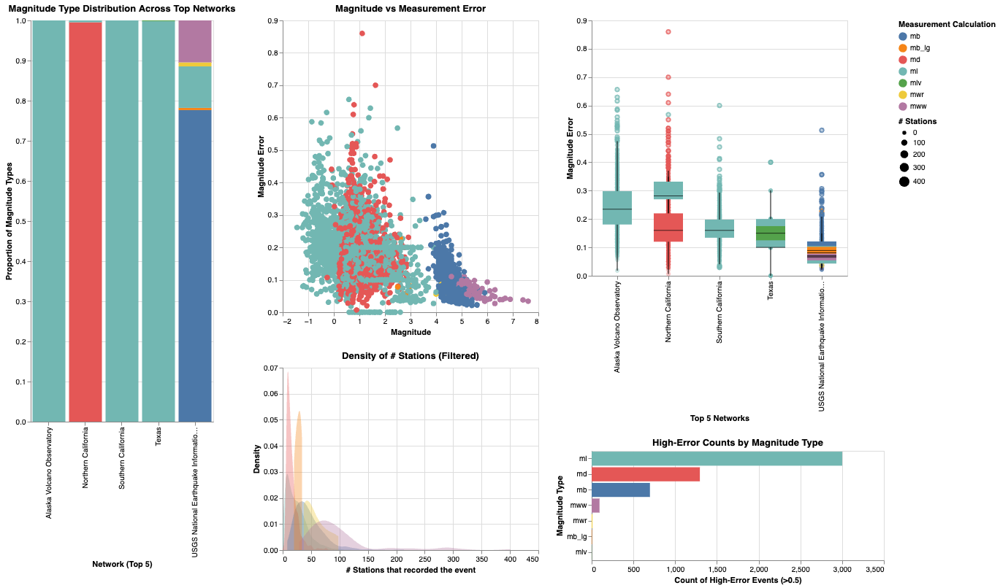

In [15]:
# -------------------------
# Data Prep
# -------------------------

# Filter top 5 networks
top_nets = earthquakes['net'].value_counts().nlargest(5).index
top_earthquakes = earthquakes[earthquakes['net'].isin(top_nets)].copy()

# Map full network names
network_labels = {
    'av': 'Alaska Volcano Observatory',
    'ci': 'Southern California',
    'nc': 'Northern California',
    'tx': 'Texas',
    'us': 'USGS National Earthquake Information Center'
}
top_earthquakes['net_full'] = top_earthquakes['net'].map(network_labels)

# Normalize counts for stacked bar
prop_df = (
    top_earthquakes.groupby(['net_full','magType'], as_index=False)
    .agg(count=('magType','count'))
)
prop_df['prop'] = prop_df.groupby('net_full')['count'].transform(lambda x: x/x.sum())

# -------------------------
# Interactive legend for stacked bar (direct manipulation)
# -------------------------
legend_select = alt.selection_point(fields=['magType'], bind='legend', empty='all')

stacked_bar = (
    alt.Chart(prop_df)
    .mark_bar()
    .encode(
        x=alt.X('net_full:N', title="Network (Top 5)"),
        y=alt.Y('prop:Q', title="Proportion of Magnitude Types"),
        color=alt.Color('magType:N', title='Measurement Calculation'),
        tooltip=[
            alt.Tooltip('net_full:N', title='Network'),
            alt.Tooltip('magType:N', title='Magnitude Type'),
            alt.Tooltip('count:Q', title='Count'),
            alt.Tooltip('prop:Q', title='Proportion', format=".4%")
        ],
        order=alt.Order('magType', sort='ascending'),
        opacity=alt.condition(legend_select, alt.value(1), alt.value(0.2))
    )
    .add_params(legend_select)
    .properties(
        width=250,
        height=550,
        title="Magnitude Type Distribution Across Top Networks"
    )
)

# -------------------------
# Checkbox for scaling point size by # stations
# -------------------------
bind_checkbox = alt.binding_checkbox(name='Scale point size by # Stations')
size_param = alt.param(bind=bind_checkbox, value=False)  # default unchecked

# -------------------------
# Brush for scatter
# -------------------------
brush = alt.selection_interval(encodings=['x','y'])
# Selection for bi-directional click
magtype_select = alt.selection_point(fields=['magType'])

# Scatter plot: mag vs magError with point size toggle
scatter = (
    alt.Chart(top_earthquakes)
    .mark_point(filled=True)
    .encode(
        x=alt.X('mag:Q', title='Magnitude'),
        y=alt.Y('magError:Q', title='Magnitude Error'),
        color=alt.Color('magType:N', title='Measurement Calculation'),
        size=alt.condition(size_param, alt.Size('nst:Q', title='# Stations', scale=alt.Scale(range=[30,200])), alt.value(60)),
        tooltip=['net_full:N','mag:N','magType:N','magError:Q','depth:Q','type:N','nst:Q'],
        opacity=alt.condition(brush, alt.value(1.0), alt.value(0.3))
    )
    .transform_filter(legend_select)       # stacked bar filter
    .transform_filter(magtype_select)      # filtered by clicked bar
    .add_params(brush, size_param)
    .properties(width=350, height=400, title='Magnitude vs Measurement Error')
)

# -------------------------
# High-error count bar chart (derived data)
# -------------------------
HIGH_ERROR_THRESHOLD = 0.5  # example threshold

high_error_bar = (
    alt.Chart(top_earthquakes)
    .mark_bar()
    .encode(
        x=alt.X('count():Q', title=f'Count of High-Error Events (>{HIGH_ERROR_THRESHOLD})'),
        y=alt.Y('magType:N', title='Magnitude Type', sort='-x'),
        tooltip=[alt.Tooltip('magType:N', title='Measurement Calculation'),
                 alt.Tooltip('count():Q', title='Count')],
        color=alt.Color('magType:N', title='Measurement Calculation'),
        opacity=alt.condition(magtype_select, alt.value(1.0), alt.value(0.5))
    )
    .transform_filter(brush)          # brush from scatter
    .transform_filter(legend_select)  # stacked bar filter
    .add_params(magtype_select)
    .properties(width=400, height=150, title='High-Error Counts by Magnitude Type')
)

# -------------------------
# Boxplot + jitter: magError distribution for top 5 networks
# -------------------------

# Jittered points layer
jitter = (
    alt.Chart(top_earthquakes)
    .mark_circle(size=40, opacity=0.35)
    .encode(
        x=alt.X('net_full:N', title='Top 5 Networks'),
        y=alt.Y('magError:Q', title='Magnitude Error'),
        color=alt.Color('magType:N', title='Measurement Calculation'),
        tooltip=['net_full:N', 'mag:N', 'magError:Q', 'magType:N', 'nst:Q', 'depth:Q'
        ],
    )
    .transform_filter(legend_select)
    .transform_filter(brush)
    .transform_filter(magtype_select)
    .add_params(legend_select, brush, magtype_select)
)

# Boxplot layer
box = (
    alt.Chart(top_earthquakes)
    .mark_boxplot(size=40, median={'color': 'black'})
    .encode(
        x=alt.X('net_full:N', title='Top 5 Networks'),
        y=alt.Y('magError:Q', title='Magnitude Error'),
        color=alt.Color('magType:N'),
    )
    .transform_filter(legend_select)
    .transform_filter(brush)
    .transform_filter(magtype_select)
)

magerror_boxplot = (
    (jitter + box)
    .properties(
        width=350,
        height=350,
        title="Magnitude Error Distribution Across Top 5 Networks"
    )
)

# Jittered points layer
jitter = (
    alt.Chart(top_earthquakes)
    .mark_circle(size=40, opacity=0.35)
    .encode(
        x=alt.X('net_full:N'),
        y='magError:Q',
        color='magType:N',
        tooltip=['net_full:N','mag:N','magError:Q','magType:N','nst:Q']
    )
    .transform_filter(legend_select)
    .transform_filter(brush)
    .transform_filter(magtype_select)
)

# Boxplot layer
box = (
    alt.Chart(top_earthquakes)
    .mark_boxplot(size=40, median={'color': 'black'})
    .encode(
        x=alt.X('net_full:N', title='Top 5 Networks'),
        y=alt.Y('magError:Q', title='Magnitude Error'),
        color=alt.Color('magType:N'),
    )
    .transform_filter(legend_select)
    .transform_filter(brush)
    .transform_filter(magtype_select)
)

magerror_boxplot = (
    (jitter + box)
    .add_params(legend_select, brush, magtype_select)
    .properties(width=350, height=350)
)

# ------------
# DENSITY PLOT - STATIONS
# ------------

nst_density = (
    alt.Chart(top_earthquakes)
    .transform_filter(legend_select)
    .transform_filter(brush)
    .transform_filter(magtype_select)
    .transform_density(
        'nst',
        groupby=['magType'],
        as_=['nst', 'density']
    )
    .mark_area(opacity=0.35)
    .encode(
        x=alt.X('nst:Q', title='# Stations that recorded the event'),
        y=alt.Y('density:Q', title='Density'),
        color=alt.Color('magType:N', title='Measurement Calculation'),
        tooltip=['magType:N', 'density:Q']
    )
    .properties(width=350, height=250, title='Density of # Stations (Filtered)')
)


# ------
# FINAL
# ------
view1 = stacked_bar | (scatter & nst_density) | (magerror_boxplot & high_error_bar)
view1

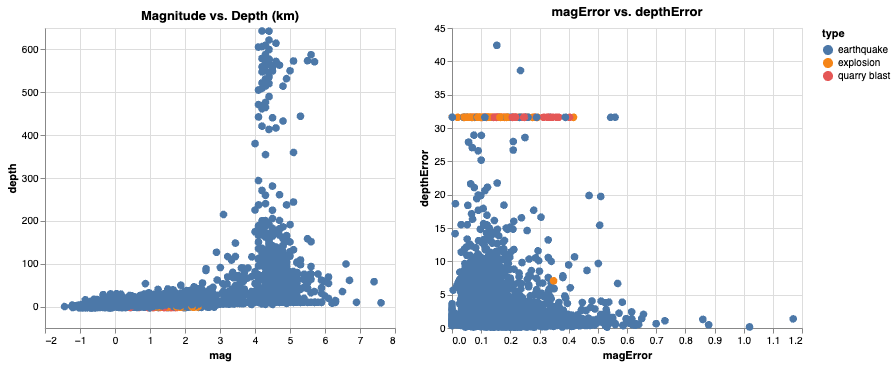

In [13]:
# Create a single brush selection that will be shared across both charts
brush = alt.selection_interval() 

# Scatter Plot 1: mag vs. depth
plot1 = alt.Chart(earthquakes).mark_circle(size=60).encode(
    x=alt.X('mag:Q', scale=alt.Scale(zero=False)),
    y=alt.Y('depth:Q', scale=alt.Scale(zero=False)),
    color=alt.when(brush).then('type:N').otherwise(alt.value('lightgray')),
    opacity=alt.when(brush).then(alt.value(1.0)).otherwise(alt.value(0.3)),
    tooltip=['type:N', 'magType:N', 'mag:Q', 'depth:Q']
).add_params(
    brush 
).properties(
    width=350,
    height=300,
    title='Magnitude vs. Depth (km)'
)

# Scatter Plot 2: magError vs. depthError
plot2 = alt.Chart(earthquakes).mark_circle(size=60).encode(
    x=alt.X('magError:Q', scale=alt.Scale(zero=False)),
    y=alt.Y('depthError:Q', scale=alt.Scale(zero=False)),
    color=alt.when(brush).then('type:N').otherwise(alt.value('lightgray')),  # TODO: Add conditional color encoding
    opacity=alt.when(brush).then(alt.value(1.0)).otherwise(alt.value(0.3)),  # TODO: Add conditional opacity encoding
    tooltip=['type:N', 'magType:N', 'magError:Q', 'depthError:Q']
).add_params(
    brush 
).properties(
    width=350,
    height=300,
    title='magError vs. depthError'
)

# Display side by side
plot1 | plot2

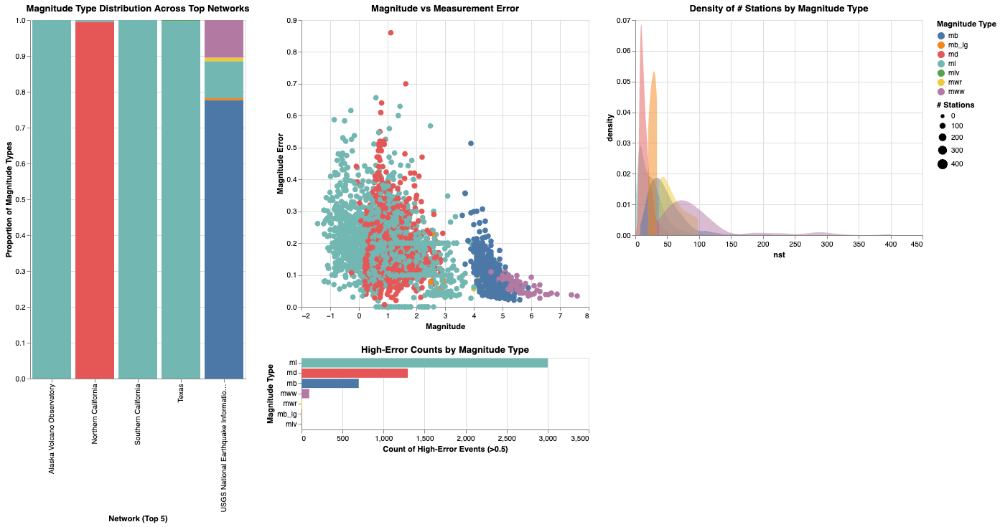

In [3]:
# -------------------------
# Data Prep
# -------------------------

# Filter top 5 networks
top_nets = earthquakes['net'].value_counts().nlargest(5).index
top_earthquakes = earthquakes[earthquakes['net'].isin(top_nets)].copy()

# Map full network names
network_labels = {
    'av': 'Alaska Volcano Observatory',
    'ci': 'Southern California',
    'nc': 'Northern California',
    'tx': 'Texas',
    'us': 'USGS National Earthquake Information Center'
}
top_earthquakes['net_full'] = top_earthquakes['net'].map(network_labels)

# Normalize counts for stacked bar
prop_df = (
    top_earthquakes.groupby(['net_full','magType'], as_index=False)
    .agg(count=('magType','count'))
)
prop_df['prop'] = prop_df.groupby('net_full')['count'].transform(lambda x: x/x.sum())

# -------------------------
# Interactive legend for stacked bar (direct manipulation)
# -------------------------
legend_select = alt.selection_point(fields=['magType'], bind='legend', empty='all')

stacked_bar = (
    alt.Chart(prop_df)
    .mark_bar()
    .encode(
        x=alt.X('net_full:N', title="Network (Top 5)"),
        y=alt.Y('prop:Q', title="Proportion of Magnitude Types"),
        color=alt.Color('magType:N', title="Magnitude Type"),
        tooltip=[
            alt.Tooltip('net_full:N', title='Network'),
            alt.Tooltip('magType:N', title='Magnitude Type'),
            alt.Tooltip('count:Q', title='Count'),
            alt.Tooltip('prop:Q', title='Proportion', format=".2f")
        ],
        order=alt.Order('magType', sort='ascending'),
        opacity=alt.condition(legend_select, alt.value(1), alt.value(0.2))
    )
    .add_params(legend_select)
    .properties(
        width=300,
        height=500,
        title="Magnitude Type Distribution Across Top Networks"
    )
)

# -------------------------
# Checkbox for scaling point size by # stations
# -------------------------
bind_checkbox = alt.binding_checkbox(name='Scale point size by # Stations')
size_param = alt.param(bind=bind_checkbox, value=False)  # default unchecked

# -------------------------
# Brush for scatter
# -------------------------
brush = alt.selection_interval(encodings=['x','y'])
# Selection for bi-directional click
magtype_select = alt.selection_point(fields=['magType'])

# Scatter plot: mag vs magError with point size toggle
scatter = (
    alt.Chart(top_earthquakes)
    .mark_point(filled=True)
    .encode(
        x=alt.X('mag:Q', title='Magnitude'),
        y=alt.Y('magError:Q', title='Magnitude Error'),
        color=alt.Color('magType:N', title='Magnitude Type'),
        size=alt.condition(size_param, alt.Size('nst:Q', title='# Stations', scale=alt.Scale(range=[30,200])), alt.value(60)),
        tooltip=['net_full:N','mag:N','magType:N','magError:Q','depth:Q','type:N','nst:Q'],
        opacity=alt.condition(brush, alt.value(1.0), alt.value(0.3))
    )
    .transform_filter(legend_select)       # stacked bar filter
    .transform_filter(magtype_select)      # now also filtered by clicked bar
    .add_params(brush, size_param)
    .properties(width=400, height=400, title='Magnitude vs Measurement Error')
)

# -------------------------
# High-error count bar chart (derived data)
# -------------------------
HIGH_ERROR_THRESHOLD = 0.5  # example threshold

high_error_bar = (
    alt.Chart(top_earthquakes)
    .mark_bar()
    .encode(
        x=alt.X('count():Q', title=f'Count of High-Error Events (>{HIGH_ERROR_THRESHOLD})'),
        y=alt.Y('magType:N', title='Magnitude Type', sort='-x'),
        tooltip=[alt.Tooltip('magType:N', title='Magnitude Type'),
                 alt.Tooltip('count():Q', title='Count')],
        color=alt.Color('magType:N', title='Magnitude Type'),
        opacity=alt.condition(magtype_select, alt.value(1.0), alt.value(0.5))
    )
    .transform_filter(brush)  # brush from scatter
    .transform_filter(legend_select)  # stacked bar filter
    .add_params(magtype_select)
    .properties(width=400, height=100, title='High-Error Counts by Magnitude Type')
)

# -------------------------
# Final layout
# -------------------------
# view1 = stacked_bar | (scatter & high_error_bar)
# view1

# -------------------------
# Histogram of # stations (nst)
# -------------------------

# Histogram: overall distribution, layered by magType
# nst_hist = (
#     alt.Chart(top_earthquakes)
#     .mark_bar(opacity=0.7)
#     .encode(
#         x=alt.X('nst:Q', bin=alt.Bin(maxbins=30), title='# Stations'),
#         y=alt.Y('count():Q', title='Count of Earthquakes'),
#         color=alt.Color('magType:N', title='Magnitude Type'),
#         tooltip=['magType:N', 'count():Q']
#     )
#     .transform_filter(legend_select)  # stacked bar legend filter
#     .transform_filter(brush)          # scatter brush filter
#     .add_params(magtype_select)
#     .properties(width=400, height=300, title='Distribution of # Stations by Magnitude Type')
# )

# # -------------------------
# # Histogram / bar chart: # stations vs network, color by magType
# # -------------------------
# nst_network_chart = (
#     alt.Chart(top_earthquakes)
#     .mark_bar(opacity=0.7)
#     .encode(
#         x=alt.X('net_full:N', title='Network'),
#         y=alt.Y('average(nst):Q', title='# Stations'),
#         color=alt.Color('magType:N', title='Magnitude Type', scale=alt.Scale(scheme='category10')),
#         tooltip=['net_full:N','magType:N','average(nst):Q']
#     )
#     .transform_filter(legend_select)  # stacked bar legend filter
#     .transform_filter(brush)          # scatter brush filter
#     .transform_calculate(
#         net_selected=f'datum["{network_param.name}"]'  # dynamic axis binding
#     )
#     .add_params(network_param)
#     .properties(width=400, height=300,
#                 title='Number of Stations by Network (Top 5) and Magnitude Type')
# )

nst_density = (
    alt.Chart(top_earthquakes)
    .transform_filter(legend_select)
    .transform_filter(brush)
    .transform_density('nst', groupby=['magType'], as_=['nst','density'])
    .mark_area(opacity=0.5)
    .encode(
        x='nst:Q',
        y='density:Q',
        color='magType:N',
        tooltip=['magType:N','density:Q']
    )
    .properties(width=400, height=300, title='Density of # Stations by Magnitude Type')
)

# -------------------------
# Updated final layout
# -------------------------
view1 = stacked_bar | (scatter & high_error_bar) | nst_density
view1